# Adversarial Example Detection

## Sample Dataset

### N-category = 10
### N-sample = 10

In [1]:
import numpy as np
import torch
import torchvision.models as models
from torch.utils.data import DataLoader
from torchvision import transforms

from utils import *
from datasets import *

import warnings
warnings.filterwarnings("ignore")

In [2]:
folder = '/home/advattack/imagenet/ILSVRC_KAGGLE/sampled_imagenet'
n_category = 10
n_sample = 10

dataset = ImageDataset(folder)
dataloader = DataLoader(dataset, batch_size=100, shuffle=False)

Sampled ImageNet dataset: 10 sampled categories, 10 sampled images for each category.


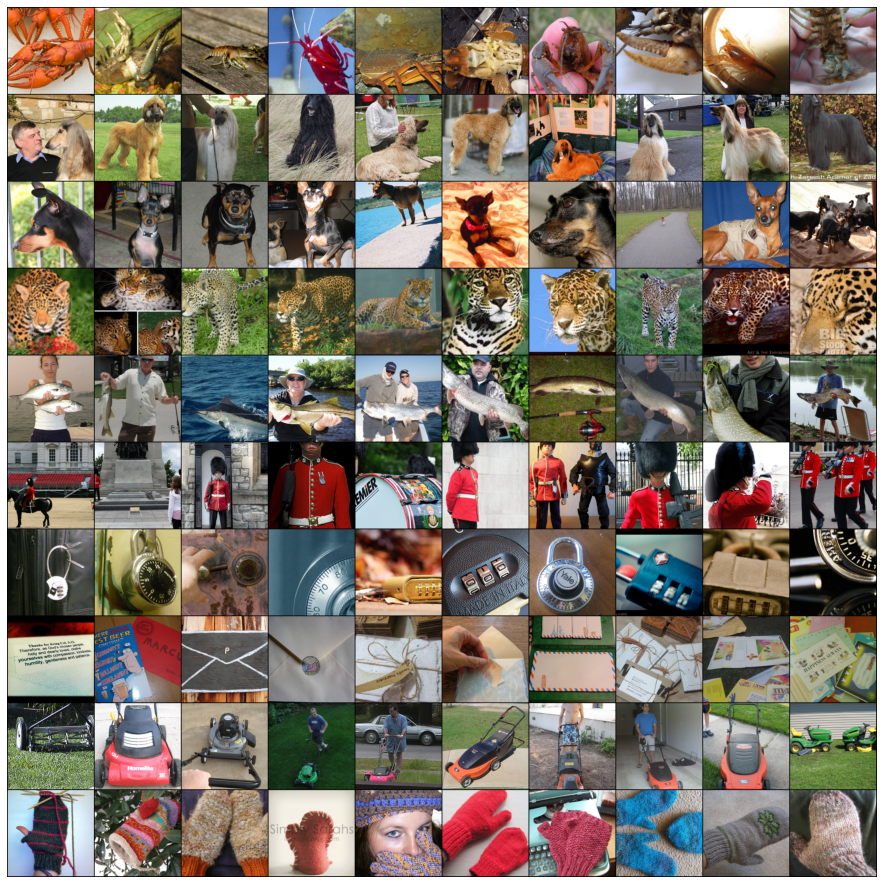

In [3]:
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

show_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])
dataloader.dataset.transform = show_transform

x, _ = next(iter(dataloader))
grid_img = make_grid(x, padding=2, nrow=n_category)

print('Sampled ImageNet dataset: 10 sampled categories, 10 sampled images for each category.')
plt.figure(figsize=(16, 16))
plt.axis('off')
plt.imshow(grid_img.permute(1, 2, 0))

## Model

### ResNet-18

In [4]:
model = models.resnet18(pretrained=True).to(device).eval()

## Normalization & inverse normalization

In [5]:
normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.255],
    std=[1/0.229, 1/0.224, 1/0.255]
)

## Generate Adversarial Examples

### Fast gradient sign method (FGSM)

In [6]:
from advertorch.attacks import GradientSignAttack

In [7]:
adversary = GradientSignAttack(model, eps=0.03, clip_min=None, clip_max=None, targeted=False)

In [8]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    normalize
])

ori_dataset = ImageDataset(folder, return_details=True, transform=transform)
ori_dataloader = DataLoader(ori_dataset, batch_size=10, shuffle=False)

In [9]:
adv_examples = []
for i, (x, y, category, fname) in enumerate(ori_dataloader):
    x, y = x.to(device), y.to(device)

    adv_untargeted = adversary.perturb(x, y)
    adv_examples.append(adv_untargeted)

    print('Processing ... {:3.2f}%'.format(100*((i+1)/len(ori_dataloader))), end='\r')
adv_examples = torch.cat(adv_examples, axis=0)

In [10]:
# enhance perturbation visualization result
def enhance(x, factor=40):
    return factor * x

# show comparison table
def show_table(title, row, y1, y2, y3):
    column = [""] + ['sample # {}'.format(i) for i in range(len(y_gt))]
    data = [[i] for i in row]
    
    for i in range(len(y1)):
        data[0].append(y1[i].item())
        data[1].append(y2[i].item())
        data[2].append(y3[i].item())
    
    plt.figure(figsize=(16, 1.5))
    plt.table(cellText=data, colLabels=column, loc='center', cellLoc='center')
    plt.axis('tight')
    plt.axis('off')
    plt.title(title)
    plt.show()

In [11]:
ori_dataset = ImageDataset(folder, return_details=False, transform=transform)
adv_dataset = AdvDataset(adv_examples=adv_examples, transform=None)

ori_dataloader = DataLoader(ori_dataset, batch_size=10, shuffle=False)
adv_dataloader = DataLoader(adv_dataset, batch_size=10, shuffle=False)

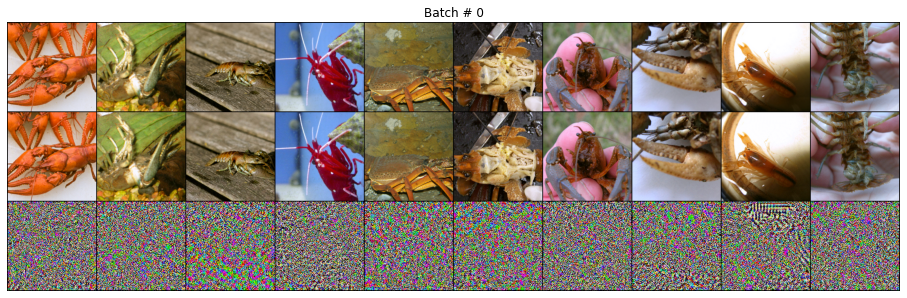

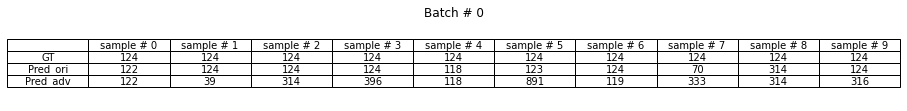

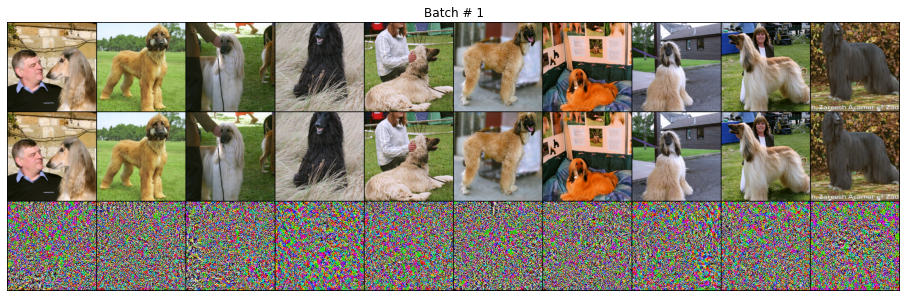

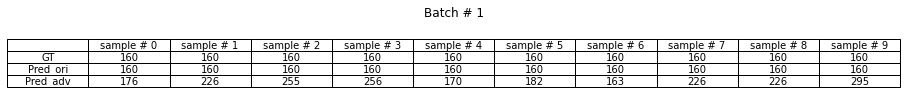

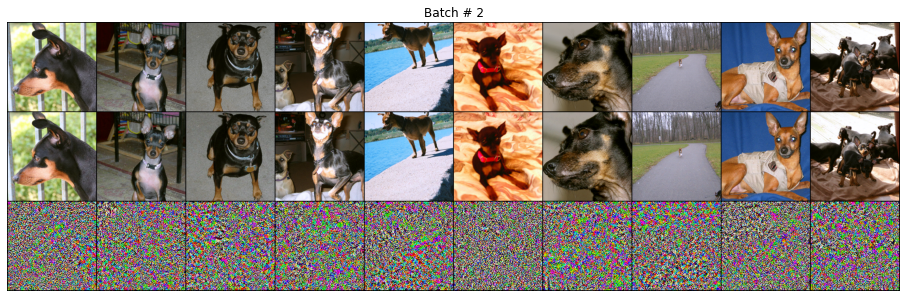

...

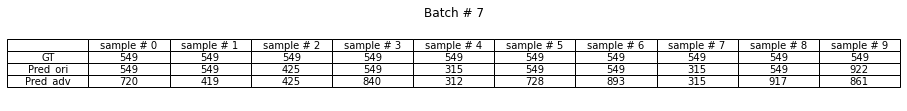

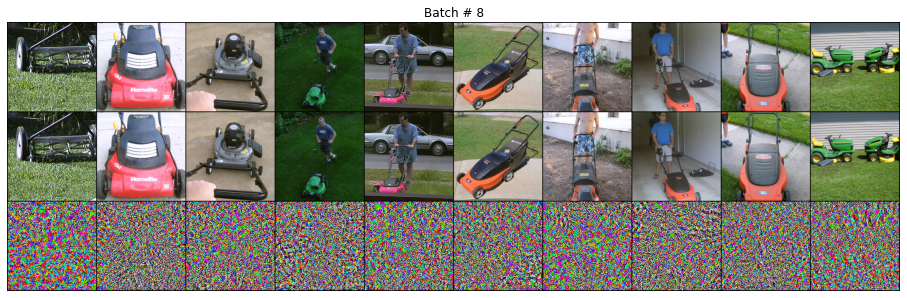

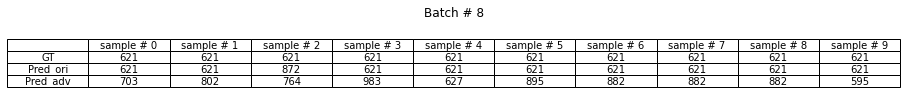

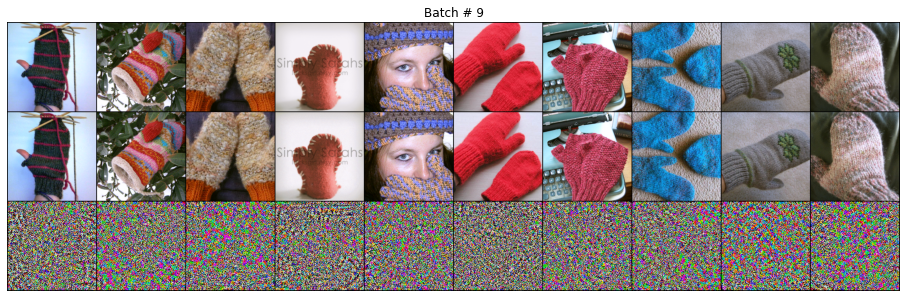

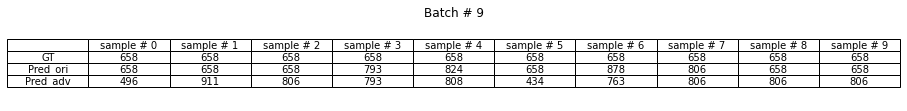

In [12]:
ori = []
adv = []

y_gt = []
pred_ori = []
pred_adv = []

with torch.no_grad():
    for ori_x, ori_y in ori_dataloader:
        ori.append(ori_x)
        y_gt.append(ori_y)
        ori_x = ori_x.to(device)
        pred_ori.append(model(ori_x).argmax(axis=1).cpu())
    
    for adv_x in adv_dataloader:
        adv.append(adv_x)
        adv_x = adv_x.to(device)
        pred_adv.append(model(adv_x).argmax(axis=1).cpu())

for i in range(len(y_gt)):
    ori_x = torch.clamp(inv_normalize(ori[i]), min=0, max=1)
    adv_x = torch.clamp(inv_normalize(adv[i]), min=0, max=1)
    perturbation = torch.clamp(inv_normalize(enhance(adv[i] - ori[i], factor=60)), min=0, max=1)
    grid_img = make_grid(torch.cat([ori_x, adv_x, perturbation], axis=0), padding=2, nrow=n_category)
    plt.figure(figsize=(16, 6))
    plt.title('Batch # {}'.format(i))
    plt.axis('off')
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.show()
    
    show_table(
        title = 'Batch # {}'.format(i),
        row = ['GT', 'Pred_ori', 'Pred_adv'],
        y1 = y_gt[i],
        y2 = pred_ori[i],
        y3 = pred_adv[i]
    )

In [13]:
ori_acc = (torch.cat(y_gt) == torch.cat(pred_ori)).sum().item() / (n_category * n_sample)
adv_acc = (torch.cat(y_gt) == torch.cat(pred_adv)).sum().item() / (n_category * n_sample)

print('Accuracy on ori set: {:3.2f}%'.format(100 * ori_acc))
print('Accuracy on adv set: {:3.2f}%'.format(100 * adv_acc))

Accuracy on ori set: 73.00%
Accuracy on adv set: 0.00%


## Operations

### Tools

In [14]:
def viz_op(viz_list, op_name, nrow=10):
    grid_img = make_grid(torch.clamp(torch.stack(viz), min=0, max=1), padding=2, nrow=10)
    plt.figure(figsize=(16, 16))
    plt.title('{} Operator Visulization'.format(op_name))
    plt.axis('off')
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.show()

### SVD

In [15]:
def svd_transform(ratio=0.2, n_sig=None):
    def svd_operator(x):
        u, s, v = np.linalg.svd(x)
            
        if n_sig is not None:
            n_singulars = n_sig
        else:
            n_singulars = int(len(s) * ratio)
        
        u = u[..., : n_singulars]
        s = np.apply_along_axis(np.diag, -1, s[..., : n_singulars])
        v = v[..., : n_singulars, :]
        
        res = u @ s @ v
            
        return torch.from_numpy(res)
        
    def svd_handler(x):
        is_batch = len(x.size()) == 4
        if is_batch:
            res = []
            for i in range(x.size(0)):
                res.append(svd_operator(x[i]))
            return torch.stack(res)
        else:
            return svd_operator(x)
    
    return svd_handler

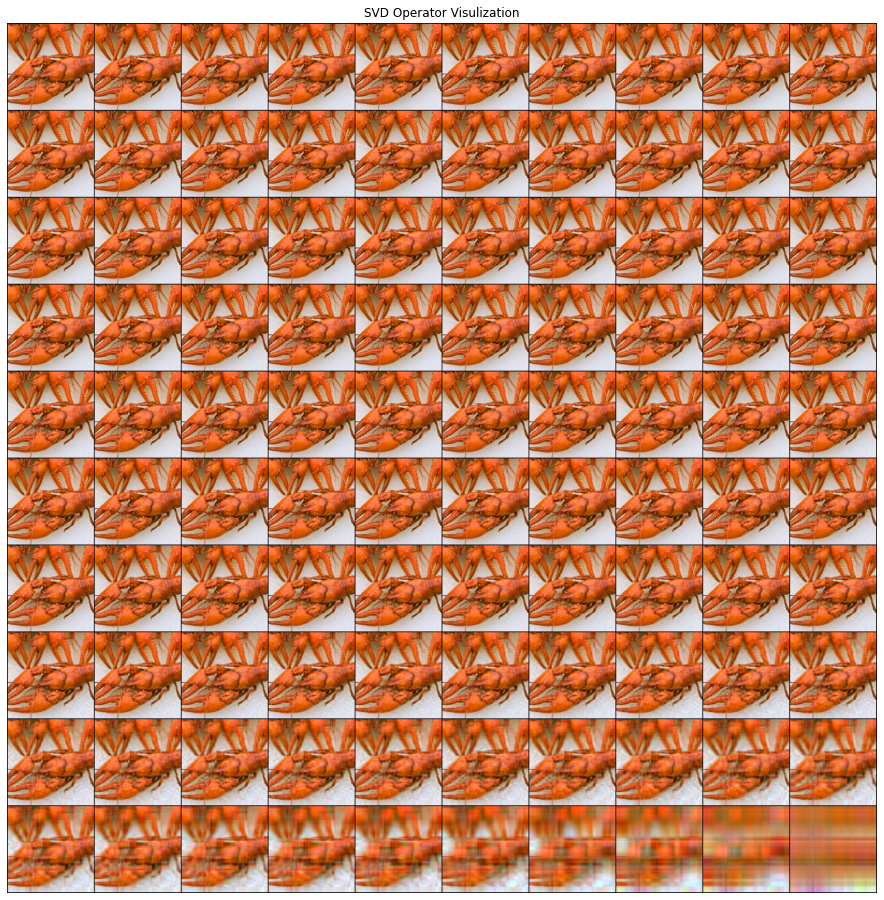

In [16]:
x, _ = ori_dataset[0]

viz = []
for i in range(100, 0, -1):
    svd = svd_transform(n_sig=i)
    viz.append(inv_normalize(svd(x)))
    
viz_op(viz, op_name='SVD')

### Down & Up sampling

In [17]:
import torch.nn.functional as F

def down_up_transform(factor):
    
    def down_up_handler(x):
        size = x.size(-1)
        down = F.interpolate(x, size=int(size / factor))
        up = F.interpolate(down, size=size)
        return up
    
    return down_up_handler

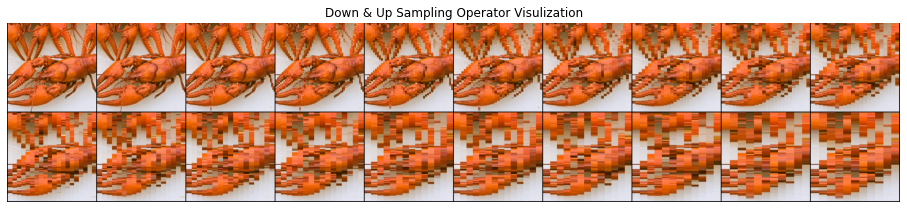

In [18]:
x, _ = ori_dataset[0]

viz = []
for i in range(1, 21):
    down_up = down_up_transform(factor=i)
    viz.append(inv_normalize(down_up(x)))
    
viz_op(viz, op_name='Down & Up Sampling')

## Module Robustness & Perturbation Sensitivity Evaluation 

In [19]:
def operation_eval(model, ori_dataset, adv_dataset, operator):
    ori_loader = DataLoader(ori_dataset, batch_size=100, shuffle=False)
    adv_loader = DataLoader(adv_dataset, batch_size=100, shuffle=False)
    
    with torch.no_grad():
        for x, _ in ori_loader:
            x, x_op = x.to(device), operator(x).to(device)
            pred_ori = model(x).argmax(axis=1).cpu().numpy()
            pred_ori_op = model(x_op).argmax(axis=1).cpu().numpy()
            
        for x in adv_loader:
            x, x_op = x.to(device), operator(x).to(device)
            pred_adv = model(x).argmax(axis=1).cpu().numpy()
            pred_adv_op = model(x_op).argmax(axis=1).cpu().numpy()
    return pred_ori, pred_ori_op, pred_adv, pred_adv_op

def plot_curve(pred_ori, pred_ori_op, pred_adv, pred_adv_op, settings, op_name=''):
    model_eval_rate = []
    perturbation_eval_rate = []
    
    pred_ori = np.array(pred_ori)
    pred_ori_op = np.array(pred_ori_op)
    pred_adv = np.array(pred_adv)
    pred_adv_op = np.array(pred_adv_op)

    for i in range(len(settings)):
        model_eval_rate.append(100 * (pred_ori[i] == pred_ori_op[i]).sum() / len(pred_ori[i]))
        perturbation_eval_rate.append(100 * (pred_adv[i] == pred_adv_op[i]).sum() / len(pred_adv[i]))

    plt.figure(figsize=(8, 5))
    plt.plot(settings, model_eval_rate, color='orange', label='Model eval curve')
    plt.plot(settings, perturbation_eval_rate, color='springgreen', label='Perturbation eval curve')
    plt.legend(loc='upper right')
    plt.xlabel('Experiment Setting')
    plt.ylabel('Same rate (%)')
    plt.xlim(settings[0], settings[-1])
    plt.ylim(0, 102)
    plt.title('{} Operation Evaluation'.format(op_name))
    plt.show()

### SVD evaluation

(224, 100) (224, 100) (224, 100) (224, 100)


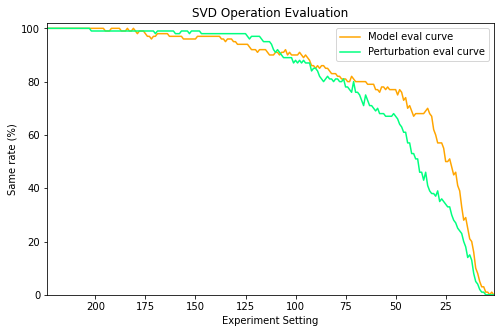

In [20]:
pred_ori, pred_ori_op, pred_adv, pred_adv_op = [], [], [], []
settings = [i for i in range(224, 0, -1)]
for i, setting in enumerate(settings):
    operator = svd_transform(n_sig=setting)
    ori, ori_op, adv, adv_op = operation_eval(model, ori_dataset, adv_dataset, operator)
    pred_ori.append(ori)
    pred_ori_op.append(ori_op)
    pred_adv.append(adv)
    pred_adv_op.append(adv_op)
    print('Evaluating ... {:3.2f}%'.format(100 * i / len(settings)), end='\r')
plot_curve(pred_ori, pred_ori_op, pred_adv, pred_adv_op, settings, op_name='SVD')

### Down & Up sampling evaluation

(20, 100) (20, 100) (20, 100) (20, 100)


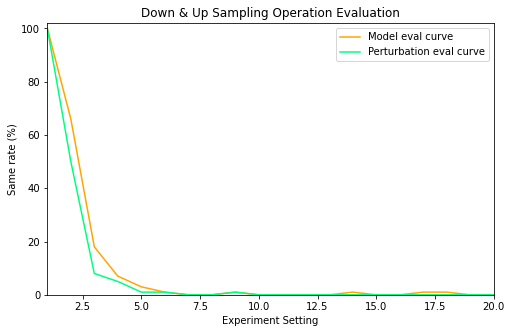

In [21]:
pred_ori, pred_ori_op, pred_adv, pred_adv_op = [], [], [], []
settings = [i for i in range(1, 21)]
for setting in settings:
    operator = down_up_transform(factor=setting)
    ori, ori_op, adv, adv_op = operation_eval(model, ori_dataset, adv_dataset, operator)
    pred_ori.append(ori)
    pred_ori_op.append(ori_op)
    pred_adv.append(adv)
    pred_adv_op.append(adv_op)
    print('Evaluating ... {:3.2f}%'.format(100 * i / len(settings)), end='\r')
plot_curve(pred_ori, pred_ori_op, pred_adv, pred_adv_op, settings, op_name='Down & Up Sampling')